### Notebook for the undifferentiated fetal cells correction with `scvi`
- **Developed by:** Anna Maguza
- **Place:** Wuerzburg Institute for System Immunology
- **Created date:** 20th May 2024
- **Last modified date:** 20th May 2024

##### Import packages

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
from pywaffle import Waffle
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

/home/amaguza/miniforge3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Setup working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.3
scanpy      1.9.6
-----
PIL                         10.1.0
absl                        NA
aiohttp                     3.8.6
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.13.1
backoff                     2.2.1
brotli                      1.1.0
bs4                         4.12.2
certifi                     2024.02.02
cffi                        1.16.0
charset_normalizer          3.3.2
chex                        0.1.7
click                       8.1.7
colorama                    0.4.6
comm                        0.1.4
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.8.0
decor

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

In [5]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

### Read in data

In [6]:
input = '/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/Fetal_cells.h5ad'
adata = sc.read_h5ad(input)

In [7]:
X_is_raw(adata)

True

+ Basic filtering

In [8]:
sc.pp.filter_genes(adata, min_counts = 1, inplace = True)
sc.pp.filter_genes(adata, min_cells = 3, inplace = True)

sc.pp.filter_cells(adata, min_genes = 50, inplace = True)
sc.pp.filter_cells(adata, min_counts = 3, inplace = True)

filtered out 378 genes that are detected in less than 1 counts
filtered out 619 genes that are detected in less than 3 cells


+ Filter Cell States of interest

In [9]:
cells_to_keep = ['Proximal progenitor', 'Distal progenitor', 'MTRNR2L12+ASS1+_SC', 'TA', 'RPS10+_RPS17+_SC', 'FXYD3+_CKB+_SC', 
                 'BEST4+ epithelial', 'Paneth']

In [10]:
adata = adata[adata.obs['Cell States'].isin(cells_to_keep)]

- Save raw counts to anndata

In [11]:
adata_raw = adata.copy()

### Calculate HVGs

In [12]:
adata.layers['counts'] = adata.X.copy()

In [13]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 22985 × 3000
    obs: 'Sample_ID', 'Cell Type', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Sex', 'Library_Preparation_Protocol', 'batch', 'Age_group', 'Location', 'Cell States', 'Cell States GCA', 'Chem', 'Layer', 'Cell States Kong', 'dataset', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'pct_counts_ribo', 'Cell_ID', '_scvi_batch', '_scvi_labels', 'n_genes', 'n_counts'
    var: 'feature_types-0-0-0', 'gene_name-1-0-0', 'gene_id-0-0', 'GENE-1-0', 'n_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts'

### Data integration with `scVI`

- Create a model

In [25]:
scvi.model.SCVI.setup_anndata(adata, 
                              categorical_covariate_keys=['Donor_ID', 'Library_Preparation_Protocol'],
                              labels_key = "Cell States", 
                              layer = 'counts')

In [26]:
scvi_model = scvi.model.SCVI(adata,
                            n_latent = 256, 
                            n_layers = 3, 
                            dispersion = 'gene-batch', 
                            gene_likelihood = 'nb', n_hidden = 1000)

- Train a model

In [27]:
scvi_model.train(50, 
                 check_val_every_n_epoch = 1, 
                 enable_progress_bar = True, 
                 accelerator = "gpu",
                 devices = [0])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 50/50: 100%|█| 50/50 [00:48<00:00,  1.00it/s, v_num=1, train_loss_step=923, train_loss_epoch=90

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|█| 50/50 [00:48<00:00,  1.02it/s, v_num=1, train_loss_step=923, train_loss_epoch=90


- Save latent representations

In [28]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

#### Evaluate model performance using the [_Svensson_](https://www.nxn.se/valent/2023/8/10/training-scvi-posterior-predictive-distributions-over-epochs) method

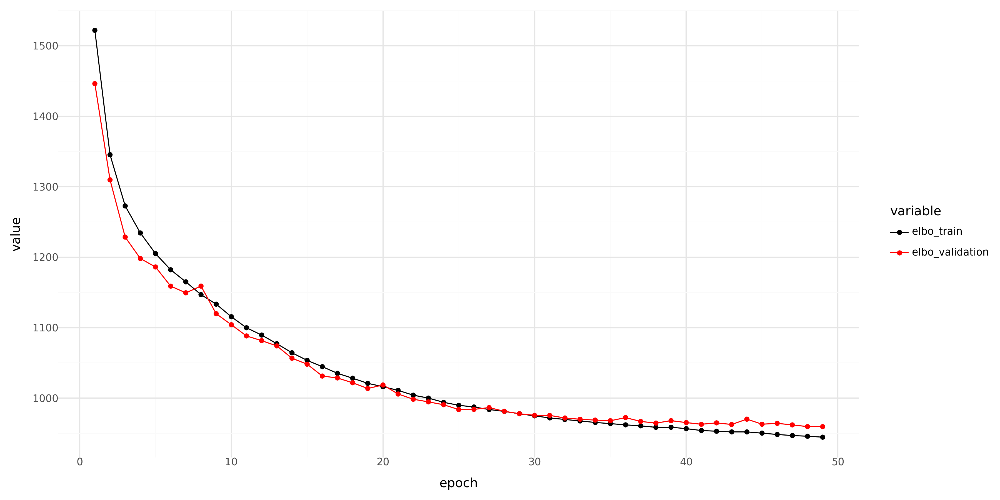

In [29]:
history_df = (
    scvi_model.history['elbo_train'].astype(float)
    .join(scvi_model.history['elbo_validation'].astype(float))
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 12, 6

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
    + p.theme_minimal()
)

print(p_)

- Calculate UMAP

In [30]:
sc.pp.neighbors(adata, use_rep = "X_scVI", n_neighbors = 256, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 1, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:42)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


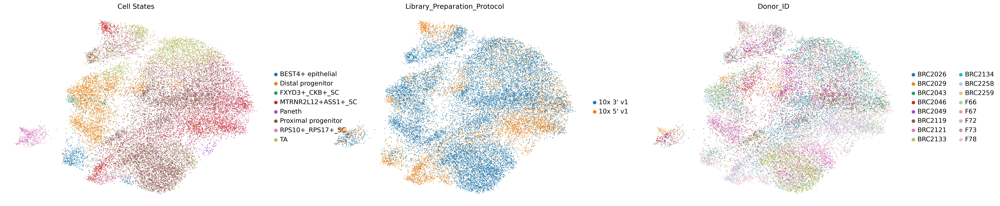

In [33]:
sc.set_figure_params(dpi = 180, figsize=(10,7))
sc.pl.umap(adata, color = ['Cell States', 'Library_Preparation_Protocol', 'Donor_ID'], ncols = 3, frameon = False, size = 7)

+ Export anndata object

In [34]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var, uns = adata.uns, obsm = adata.obsm, obsp = adata.obsp)

In [35]:
adata_export.write_h5ad('/mnt/LaCIE/annaM/gut_project/Processed_data/Gut_data/Fetal_stem_cells/FetalSC_and_undifferentiated_cells/Fetal_undifferentiated_cells.h5ad')